In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cv2
from google.colab.patches import cv2_imshow
from PIL import Image
from scipy.stats import trim_mean

Ecualización básica

In [ ]:
img = Image.open('/content/1.jpg').convert('L')
img_array = np.array(img)
height, width = img_array.shape
flat_array = img_array.flatten()

# 1. Histograma
hist, bins = np.histogram(flat_array, 256, [0,256])

# 2. Función de probabilidad (PMF)
pmf = hist / hist.sum()

# 3. Histograma acumulativ
cdf = pmf.cumsum()
cdf_normalized = cdf * (hist.max() / cdf.max())

# 4. Ecualización del histograma acumulativo
L = 256
T = np.round((L - 1) * cdf).astype(np.uint8)

# 5. Formación de la nueva imagen
image_eq_flat = T[flat_array]

# Restaurar las dimensiones de la imagen
image_eq = image_eq_flat.reshape(height, width)

## **CLAHE**

Con CV2:

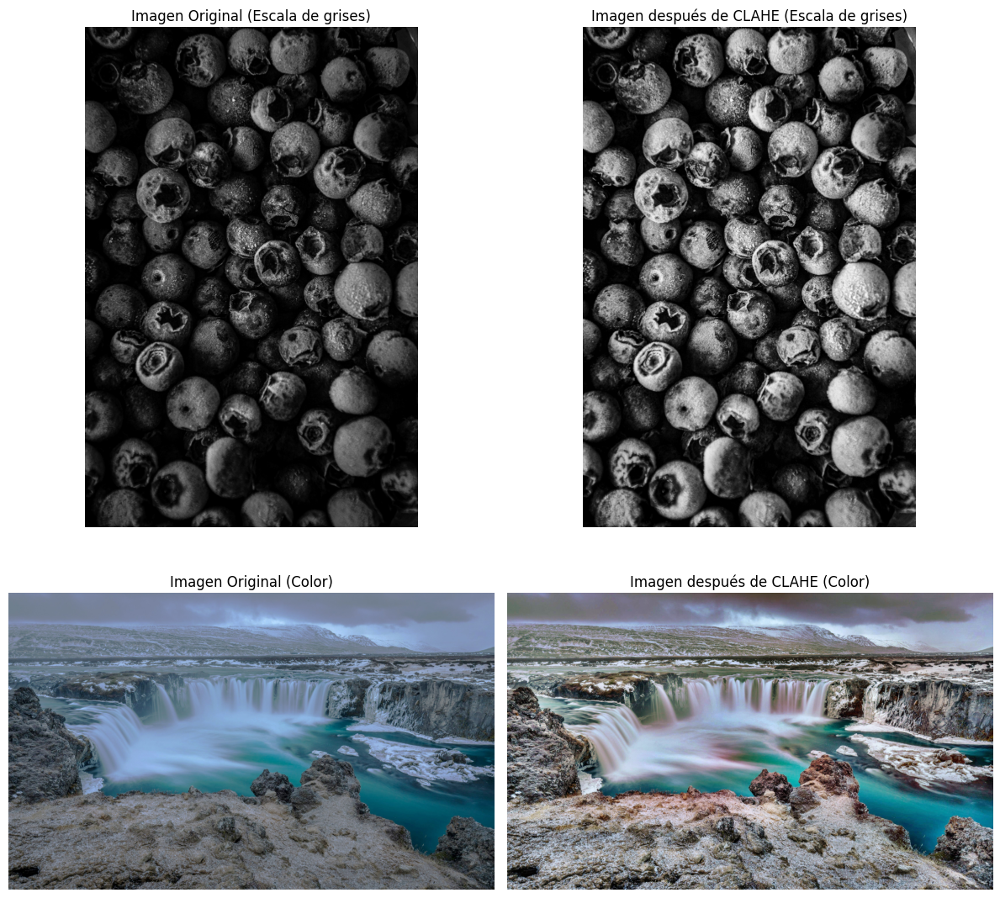

In [ ]:
# Cargar imagen en escala de grises y aplicar CLAHE
image_l = cv2.imread('/content/1.jpg', cv2.IMREAD_GRAYSCALE)  # Cargar directamente en escala de grises
clahe = cv2.createCLAHE(clipLimit=2, tileGridSize=(8, 8))
clahe_img_l = clahe.apply(image_l)

# Cargar imagen en color (RGB)
image_rgb = cv2.imread('/content/2.jpg')
image_rgb = cv2.cvtColor(image_rgb, cv2.COLOR_BGR2RGB)

# Aplicar CLAHE a cada canal por separado
channels = cv2.split(image_rgb)
clahe_img_rgb = []
for channel in channels:
    clahe_img_rgb.append(clahe.apply(channel))

# Recomponer los canales después de aplicar CLAHE
clahe_img_rgb = cv2.merge(clahe_img_rgb)

# Muestra los resultados comparativamente
fig, ax = plt.subplots(2, 2, figsize=(12, 12))

# Imagen original en escala de grises
ax[0, 0].imshow(image_l, cmap='gray')
ax[0, 0].set_title('Imagen Original (Escala de grises)')
ax[0, 0].axis('off')

# Imagen en escala de grises después de CLAHE
ax[0, 1].imshow(clahe_img_l, cmap='gray')
ax[0, 1].set_title('Imagen después de CLAHE (Escala de grises)')
ax[0, 1].axis('off')

# Imagen original en color
ax[1, 0].imshow(image_rgb)
ax[1, 0].set_title('Imagen Original (Color)')
ax[1, 0].axis('off')

# Imagen en color después de CLAHE
ax[1, 1].imshow(clahe_img_rgb)
ax[1, 1].set_title('Imagen después de CLAHE (Color)')
ax[1, 1].axis('off')

plt.tight_layout()
plt.show()


Algoritmo propio:

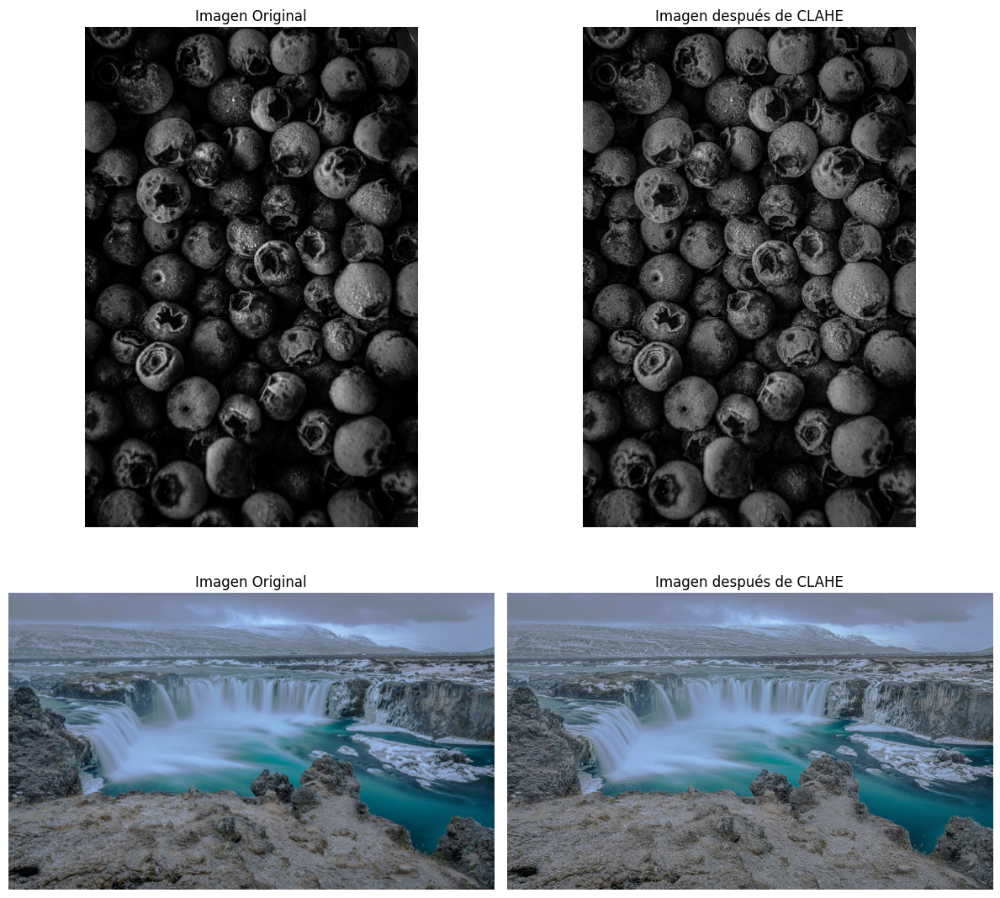

In [ ]:
# def clahe_eq_histogram(hist, limit=0.01, L=256):
#     # Función de probabilidad
#     pmf = hist / hist.sum()

#     # Limita el PMF si excede el umbral especificado
#     limit_value = limit * pmf.sum()
#     excess = np.maximum(pmf - limit_value, 0).sum()

#     # Redistribuye el exceso de manera uniforme
#     pmf = np.minimum(pmf, limit_value)
#     pmf += excess / L

#     cdf = pmf.cumsum()

#     # Crea la matriz de transformación
#     T = np.round((L - 1) * cdf).astype(np.uint8)

#     return T

def calculate_histogram(subregion):
    """Calcula el histograma de una subregión."""
    flattened = subregion.flatten()
    histogram, _ = np.histogram(flattened, bins=256, range=(0, 255))

    return histogram

def clahe_eq_histogram(hist, limit=0.01, L=256):
    # Función de probabilidad
    pmf = hist / hist.sum()

    cdf = pmf.cumsum()

    # Aplica la limitación al aumento de contraste en la CDF
    cdf_limited = np.minimum(1, cdf / (1 - limit))

    # Crea la matriz de transformación
    T = np.round((L - 1) * cdf_limited).astype(np.uint8)

    return T


def split_image(image, grid_size=(8, 8)):
  """Divide una imagen en subregiones y devuelve una lista de subregiones."""
  h, w = image.shape
  subregions = []
  coords = []

  for y in range(0, h, grid_size[0]):
      for x in range(0, w, grid_size[1]):
          # Con min aseguramos que no excedamos el tamaño de la imagen
          y1 = min(y + grid_size[0], h)
          x1 = min(x + grid_size[1], w)
          subregion = image[y:y1, x:x1]
          subregions.append(subregion)
          coords.append((y, y1, x, x1))  # Guarda las coordenadas de las subregiones para poder reconstruir la imagen despues

  return subregions, coords


def apply_equalization(subregion, T):
  """Aplica la ecualización a una subregión."""
  flattened = subregion.flatten()
  equalized_flattened = T[flattened]
  equalized_subregion = equalized_flattened.reshape(subregion.shape)

  return equalized_subregion


def reconstruct_image(subregions, coords, image_shape):
  """Reconstruye la imagen completa a partir de las subregiones ecualizadas."""
  reconstructed_image = np.zeros(image_shape, dtype=np.uint8)

  for subregion, (y, y1, x, x1) in zip(subregions, coords):
      reconstructed_image[y:y1, x:x1] = subregion

  return reconstructed_image


def clahe(image, limit=0.01, grid_size=(8, 8)):
  """ Aplica el algoritmo CLAHE a una imagen."""
  mode = image.mode
  if mode not in ('L', 'RGB'):
      raise ValueError("La imagen debe estar en escala de grises o RGB")

  img_array = np.array(image)

  if image.mode == 'RGB':
        # divide los canales
        red_channel = img_array[:, :, 0]
        green_channel = img_array[:, :, 1]
        blue_channel = img_array[:, :, 2]

        processed_channels = []

        # Aplica el CLAHE a cada canal
        for channel in [red_channel, green_channel, blue_channel]:
            subregions, coords = split_image(channel, grid_size)
            new_subregions = []
            for subregion in subregions:
                hist = calculate_histogram(subregion)
                T = clahe_eq_histogram(hist, limit)
                new_subregion = apply_equalization(subregion, T)
                new_subregions.append(new_subregion)

            # Reconstruye el canal
            processed_channel = reconstruct_image(new_subregions, coords, channel.shape)
            processed_channels.append(processed_channel)

        # Reconstruye la imagen
        reconstructed_image = np.stack(processed_channels, axis=2)

  else:
    # Aplica el CLAHE al único canal de B/W
    subregions, coords = split_image(img_array, grid_size)
    new_subregions = []

    for subregion in subregions:
        hist = calculate_histogram(subregion)
        T = clahe_eq_histogram(hist, limit)
        new_subregion = apply_equalization(subregion, T)
        new_subregions.append(new_subregion)

    reconstructed_image = reconstruct_image(new_subregions, coords, img_array.shape)


  return Image.fromarray(reconstructed_image)

# Carga las imagenes y aplica el CLAHE
image_path_l = '/content/1.jpg'
image_l = Image.open(image_path_l).convert('L')
image_path_rgb = '/content/2.jpg'
image_rgb = Image.open(image_path_rgb).convert('RGB')

new_image_l = clahe(image_l, limit=0.01, grid_size=(8, 8))
new_image_rgb = clahe(image_rgb, limit=0.005, grid_size=(8, 8))


# Muestra los resultados comparando la img original con la transformada
fig, ax = plt.subplots(2, 2, figsize=(12, 12))

ax[0, 0].imshow(image_l, cmap='gray')
ax[0, 0].set_title('Imagen Original')
ax[0, 0].axis('off')

ax[0, 1].imshow(new_image_l, cmap='gray')
ax[0, 1].set_title('Imagen después de CLAHE')
ax[0, 1].axis('off')

ax[1, 0].imshow(image_rgb)
ax[1, 0].set_title('Imagen Original')
ax[1, 0].axis('off')

ax[1, 1].imshow(new_image_rgb)
ax[1, 1].set_title('Imagen después de CLAHE')
ax[1, 1].axis('off')

plt.tight_layout()
plt.show()

In [ ]:
image_path = '/content/1.jpg'
image = Image.open(image_path).convert('L')
img_array = np.array(image)
height, width = img_array.shape
flat_array = img_array.flatten()

hist = calculate_histogram(img_array)
T = clahe_eq_histogram(hist)

# Formación de la nueva imagen
image_eq_flat = T[flat_array]

# Restaurar las dimensiones de la imagen
image_eq = image_eq_flat.reshape(height, width)

# Plot
plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(image, cmap='gray')
plt.title('Imagen original')
plt.axis('off')

plt.subplot(1, 2, 2)
plt.imshow(image_eq, cmap='gray')
plt.title('Imagen Ecualizada')
plt.axis('off')

plt.show()

# **ELIMINACIÓN DE RUIDO**

Aunque no se permite usar este filtro puesto que no lo hemos dado, lo dejo por aquí puesto que el resultado es muy bueno.

Para la 3 tenemos una hoja sobre un fondo blanco con un moderado o medio fuerte ruido gausiano multicolor.    

Tras probar varios filtros recomendados para este tipo de ruido, hemos dado con fastNlMeansDenoisingColored, que viene a ser un filtro que se basa en buscar patrones similares en la globalidad de la imagen y aplicar un promedio ponderado de los valores de los píxeles en estas regiones similares (al contrario que los filtros de la mediana o media que buscan en la vecindad).   

Tal y como recomienda la documentación de OpenCV, hemos utilizado un search window y un block size estándar. Para h_luminance (la intensidad de brillo) sin embargo hemos obtado por un valor mayor del recomendado. Pero sin duda, el parámetro que más influye para esta imagen es el de photo_render, que funciona parecido al h_luminance pero para cada canal de color y puesto que la imagen debería ser mayoritariamente verde, pero el ruido la ha alterado aplicando colores que no existían originalmente, hemos elegido un valor muy alto para este parámetro.


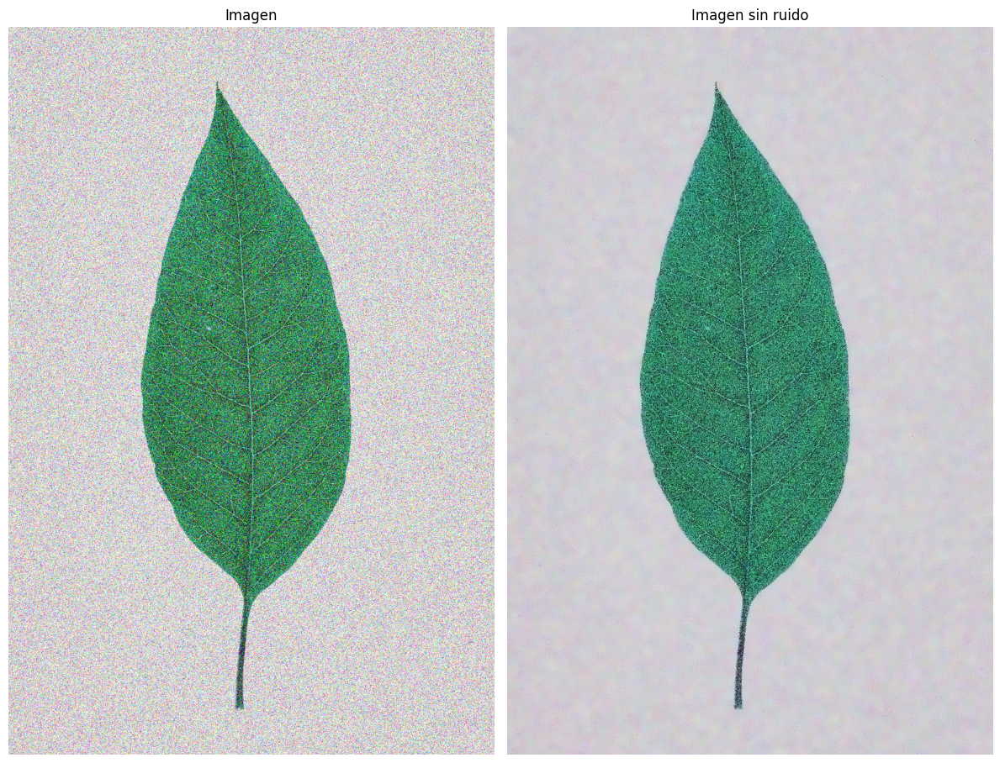

In [ ]:
image_path = '/content/3.png'

# Cargar la imagen con ruido
imagen = cv2.imread(image_path)

# Aplicar filtro mediana
h_luminance = 18
photo_render =  29
search_window =  7
block_size = 21
imagen_sin_ruido = cv2.fastNlMeansDenoisingColored(imagen, None, h_luminance, photo_render, search_window, block_size)

# Muestra los resultados comparando la img original con la transformada
fig, ax = plt.subplots(1, 2, figsize=(12, 12))

ax[0].imshow(imagen)
ax[0].set_title('Imagen')
ax[0].axis('off')

ax[1].imshow(imagen_sin_ruido)
ax[1].set_title('Imagen sin ruido')
ax[1].axis('off')

plt.tight_layout()
plt.show()

Para la 3 tenemos una hoja sobre un fondo blanco con un moderado o medio fuerte ruido gausiano

Tras probar varios filtros y ajustar los parámetros, hemos obtado por aplicar un filtro bilateral. Como tenemos ante nosotros una imagen con mucho ruido, obtamos por tomar valores de sigma bastante altos (tal y como se menciona en [la documentacion de OpenCV](https://docs.opencv.org/4.x/d4/d86/group__imgproc__filter.html#ga9d7064d478c95d60003cf839430737ed), se considera alto por encima de 150). También, como no necesitamos que la ejecucción sea en tiempo real ni tenemos restricciones temporales, hemos elegido un diametro de vecindario alto para mejorar la calidad del filtro.
Por último, cabe mencionar que al ser un único objeto centrado sobre un fondo blanco, nos interesa que SigmaSpace > SigmaColor.

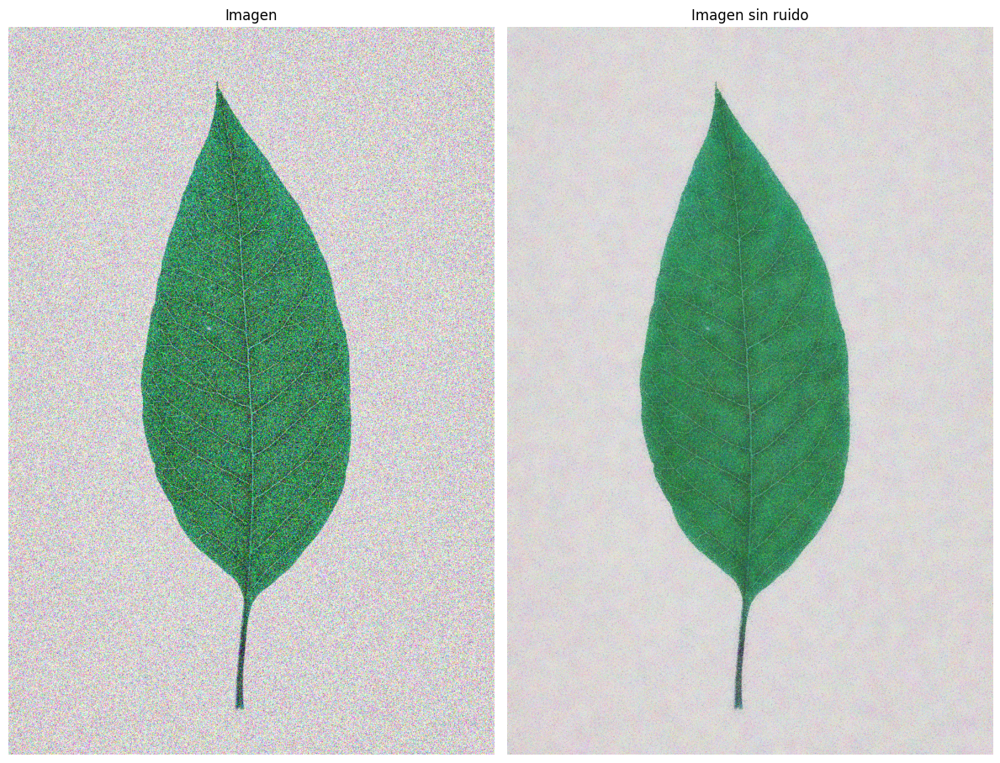

In [ ]:
image_path = '/content/3.png'

image = cv2.imread(image_path)

# Aplica el filtro bilateral
# d: diámetro de cada vecindario de píxeles
# sigmaColor: desviación estándar en el espacio de color (mayor valor significa que se mezclan más colores)
# sigmaSpace: desviación estándar en el espacio de coordenadas (mayor valor significa que se mezclan píxeles más lejanos)
filtered_image = cv2.bilateralFilter(image, d=31, sigmaColor=125, sigmaSpace=200)

# Muestra los resultados comparando la img original con la transformada
fig, ax = plt.subplots(1, 2, figsize=(12, 12))

ax[0].imshow(image)
ax[0].set_title('Imagen')
ax[0].axis('off')

ax[1].imshow(filtered_image)
ax[1].set_title('Imagen sin ruido')
ax[1].axis('off')

plt.tight_layout()
plt.show()

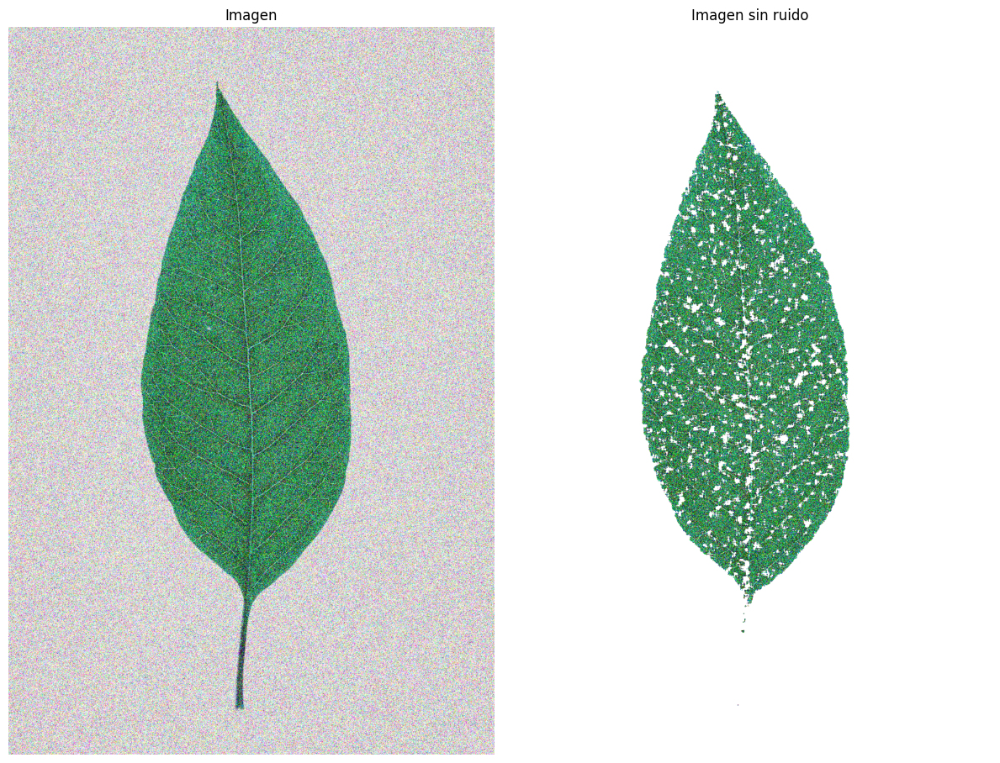

In [ ]:
def is_predominantly_green(neighborhood, alpha=0.5):
    # Contar cuántos píxeles en el vecindario son predominantemente verdes
    green_count = 0
    total_count = neighborhood.shape[0] * neighborhood.shape[1]

    for pixel in neighborhood.reshape(-1, 3):  # Recorremos los píxeles del vecindario
        r, g, b = pixel
        if g > r and g > b:  # El canal verde debe ser el mayor de los tres
            green_count += 1

    # Si más del 50% del vecindario es verde, lo consideramos predominantemente verde
    return green_count / total_count > alpha

def apply_green_filter(image, kernel_size=5, alpha=0.5):
    # Crear una imagen en blanco (255 es el valor de blanco en BGR)
    filtered_image = np.ones_like(image) * 255

    # Obtener las dimensiones de la imagen
    h, w, _ = image.shape

    # Recorrer cada píxel de la imagen (excluyendo los bordes)
    for i in range(kernel_size // 2, h - kernel_size // 2):
        for j in range(kernel_size // 2, w - kernel_size // 2):
            # Extraer el vecindario del píxel actual
            neighborhood = image[i - kernel_size // 2:i + kernel_size // 2 + 1,
                                 j - kernel_size // 2:j + kernel_size // 2 + 1]

            # Si el vecindario es predominantemente verde, mantenemos el píxel original
            if is_predominantly_green(neighborhood, alpha):
                filtered_image[i, j] = image[i, j]

    return filtered_image

image_path = '/content/3.png'

# Leer la imagen a color
image = cv2.imread(image_path)

filtered_image = apply_green_filter(image, kernel_size=9)

# Muestra los resultados comparando la img original con la transformada
fig, ax = plt.subplots(1, 2, figsize=(12, 12))

ax[0].imshow(image)
ax[0].set_title('Imagen')
ax[0].axis('off')

ax[1].imshow(filtered_image)
ax[1].set_title('Imagen sin ruido')
ax[1].axis('off')

plt.tight_layout()
plt.show()

Para la 4 tenemos una imagen en blanco y negro de una radiografia con un ruido del tipo Salt n Pepper bastante agudo.

Por suerte, este tipo de problema en imagenes en blanco y negro tienen una muy buena solución, que es el filtro de la mediana. Tras probar tamaños de kernel impares, hemos observado que obtenemos un resultado satisfactorio para un ksize de 11x11, en el que las regiones de interes han aumentado el contraste y se ha eliminado el ruido por completo.



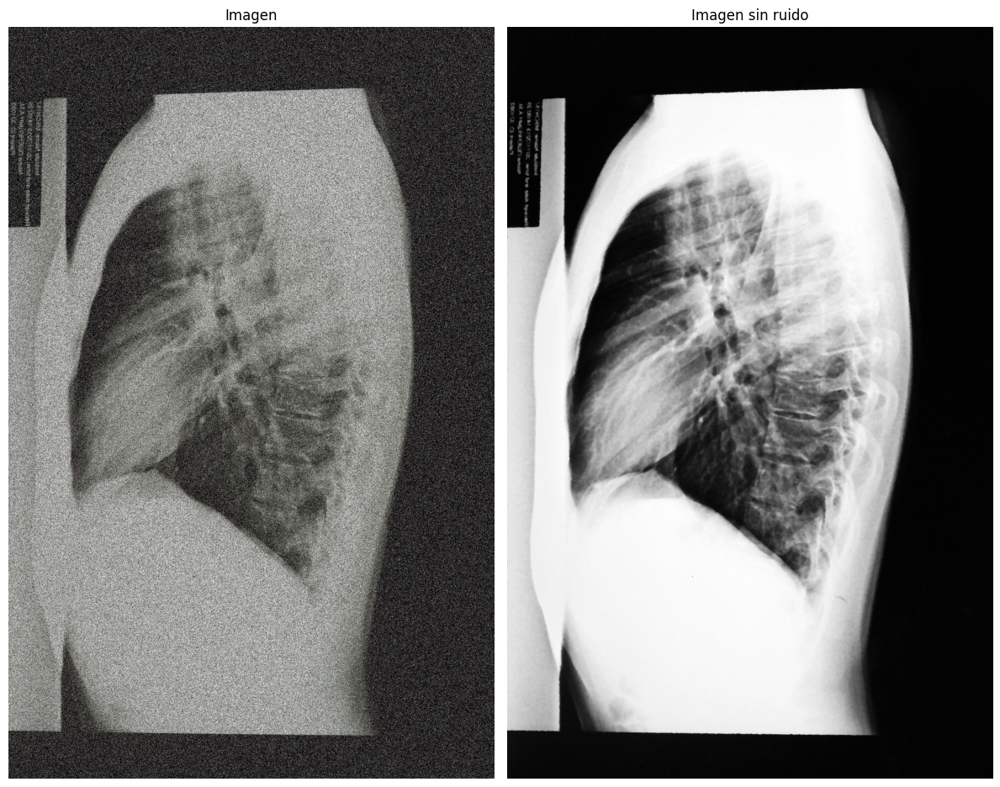

In [ ]:
image_path = '/content/4.jpg'

# Leer la imagen a color
image = cv2.imread(image_path)

imagen_filtrada = cv2.medianBlur(imagen, 11)

# Muestra los resultados comparando la img original con la transformada
fig, ax = plt.subplots(1, 2, figsize=(12, 12))

ax[0].imshow(image, cmap='gray')
ax[0].set_title('Imagen')
ax[0].axis('off')

ax[1].imshow(imagen_filtrada, cmap='gray')
ax[1].set_title('Imagen sin ruido')
ax[1].axis('off')

plt.tight_layout()
plt.show()

# **Filtro Gausiano**

Vamos a aplicar primero el filtro gausiano con cv2 en la imagen para tener una referencia. Le hemos aplicado un sigma y un kernel exagerados para obtener alguna diferencia, ya que la imagen al no tener ruido con unos parámetros estándar no sufría ningún cambio.

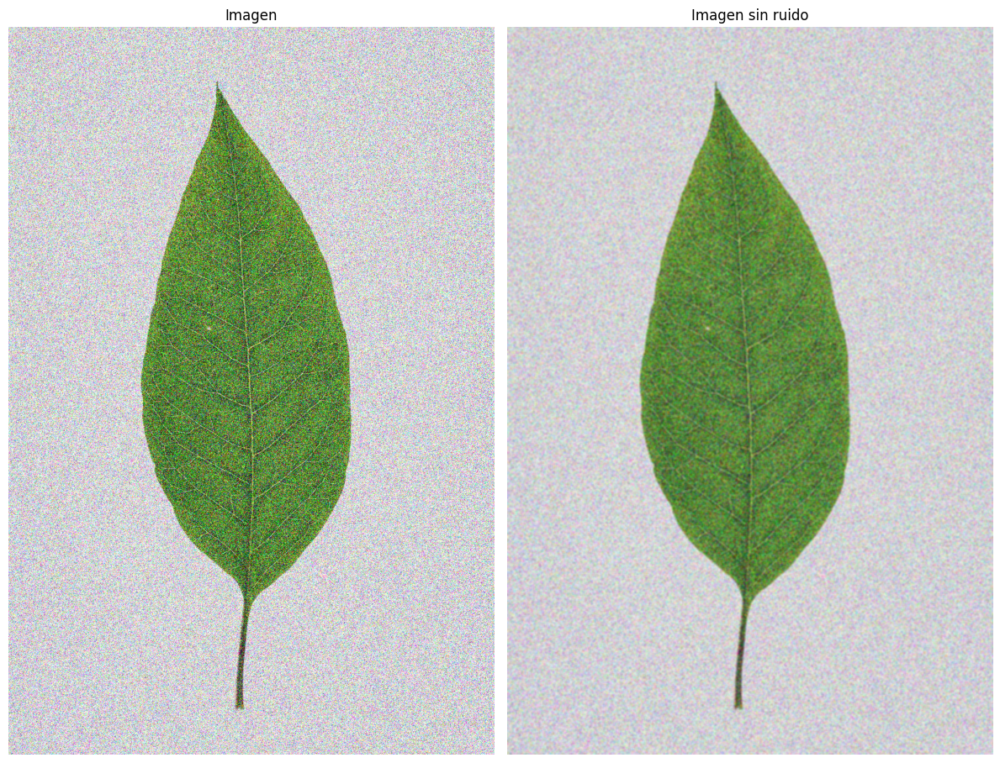

In [126]:
image_path = '/content/3.png'

# Leer la imagen a color
image = cv2.imread(image_path)

image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

imagen_filtrada = cv2.GaussianBlur(image, (5, 5), 233)

# Muestra los resultados comparando la img original con la transformada
fig, ax = plt.subplots(1, 2, figsize=(12, 12))

ax[0].imshow(image)
ax[0].set_title('Imagen')
ax[0].axis('off')

ax[1].imshow(imagen_filtrada)
ax[1].set_title('Imagen sin ruido')
ax[1].axis('off')

plt.tight_layout()
plt.show()

Algoritmo propio:

Podemos observar que al probar el algoritmo propio en la imagen 5, al igual que para la implementación de cv2, no cambia en nada ni usando un sigma exagerado.   
Si probamos con la imagen 3, que tiene más ruido, vemos que se aplica correctamente la transformación.

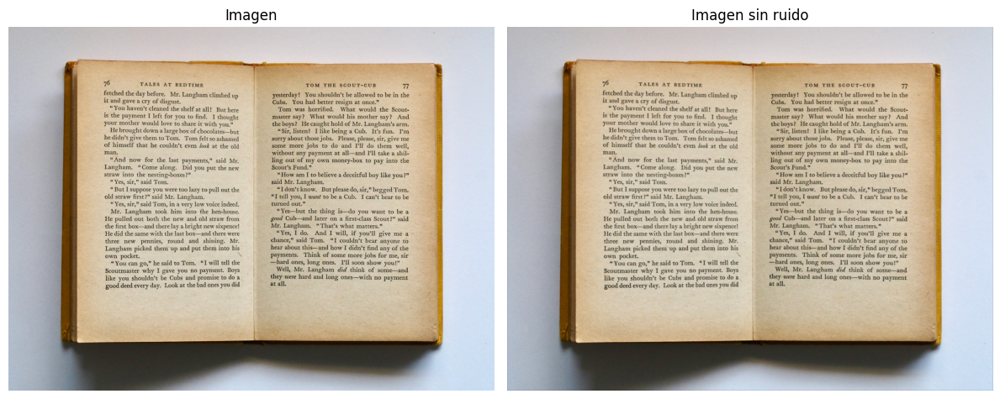

In [128]:
def gaussian_kernel(size=5, sigma=1):
    """
    Genera un kernel gaussiano 2D.
    :param size: tamaño del kernel (debe ser impar, por ejemplo, 3, 5, 7, etc.)
    :param sigma: desviación estándar de la distribución gaussiana.
    :return: kernel gaussiano 2D.
    """
    kernel = np.fromfunction(lambda x, y: (1/ (2 * np.pi * sigma ** 2)) *
                             np.exp(-((x - (size - 1) / 2) ** 2 +
                                      (y - (size - 1) / 2) ** 2) / (2 * sigma ** 2)),
                             (size, size))
    return kernel / np.sum(kernel)


def apply_gaussian_filter(image, kernel):
    """
    Aplica un filtro gaussiano a una imagen.
    :param image: imagen en formato de matriz numpy (RGB).
    :param kernel: kernel gaussiano generado.
    :return: imagen filtrada.
    """
    image = np.array(image)

    img_height, img_width, num_channels = image.shape
    kernel_size = kernel.shape[0]
    pad = kernel_size // 2

    # Padding de la imagen para aplicar la convolución
    padded_image = np.pad(image, ((pad, pad), (pad, pad), (0, 0)), mode='constant')

    # Inicializar la imagen filtrada
    filtered_image = np.zeros_like(image)

    # Aplicar la convolución (sólo sobre píxeles válidos)
    for i in range(img_height):
        for j in range(img_width):
            for c in range(num_channels):
                # Extraer la región a la que se le aplicará el kernel
                region = padded_image[i:i + kernel_size, j:j + kernel_size, c]
                filtered_image[i, j, c] = np.sum(region * kernel)

    return Image.fromarray(np.uint8(filtered_image))


image_path = '/content/5.jpg'

image = Image.open(image_path).convert('RGB')

gaussian_kernel = gaussian_kernel(5, 233)

# Aplicar el filtro gaussiano
filtered_image = apply_gaussian_filter(image, gaussian_kernel)


# Muestra los resultados comparando la img original con la transformada
fig, ax = plt.subplots(1, 2, figsize=(12, 12))

ax[0].imshow(image)
ax[0].set_title('Imagen')
ax[0].axis('off')

ax[1].imshow(filtered_image)
ax[1].set_title('Imagen sin ruido')
ax[1].axis('off')

plt.tight_layout()
plt.show()